## Yuvoh - Data Scientist Challenge


### Data Exploration

This step allows understand the data and sees,among other things, the variables distributions, missingness, variables types and cardinality.
* Profiling data
* Target distribution (histogram)
* Plots to see how the price is distributed in relation with some categorical variables
* Number of variables and observations

In [38]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np
import matplotlib._color_data as mcd

import warnings
warnings.filterwarnings("ignore")

In [39]:
data = pd.read_csv('listings.csv')
data.head()

#data.shape
# (83850, 106)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,13913,https://www.airbnb.com/rooms/13913,20190710134553,2019-07-11,Holiday London DB Room Let-on going,My bright double bedroom with a large window h...,"Hello Everyone, I'm offering my lovely double ...",My bright double bedroom with a large window h...,business,Finsbury Park is a friendly melting pot commun...,...,f,f,moderate,f,f,3,1,2,0,0.15
1,15400,https://www.airbnb.com/rooms/15400,20190710134553,2019-07-11,Bright Chelsea Apartment. Chelsea!,Lots of windows and light. St Luke's Gardens ...,Bright Chelsea Apartment This is a bright one...,Lots of windows and light. St Luke's Gardens ...,romantic,It is Chelsea.,...,f,f,strict_14_with_grace_period,t,t,1,1,0,0,0.73
2,17402,https://www.airbnb.com/rooms/17402,20190710134553,2019-07-11,Superb 3-Bed/2 Bath & Wifi: Trendy W1,"Open from June 2018 after a 3-year break, we a...",Ready again from June 2018 for bookings after ...,"Open from June 2018 after a 3-year break, we a...",none,"Location, location, location! You won't find b...",...,t,f,strict_14_with_grace_period,f,f,14,14,0,0,0.41
3,24328,https://www.airbnb.com/rooms/24328,20190710134553,2019-07-11,Battersea bedroom & office w parking shared ga...,"Artist house, bright high ceiling rooms, priva...",- End of terrace two bedroom house close to So...,"Artist house, bright high ceiling rooms, priva...",family,"- Battersea is a quiet family area, easy acces...",...,f,f,moderate,t,t,1,1,0,0,0.88
4,25023,https://www.airbnb.com/rooms/25023,20190710134553,2019-07-11,All-comforts 2-bed flat near Wimbledon tennis,"Large, all comforts, 2-bed flat; first floor; ...",10 mins walk to Southfields tube and Wimbledon...,"Large, all comforts, 2-bed flat; first floor; ...",none,This is a leafy residential area with excellen...,...,f,f,moderate,f,f,1,1,0,0,0.69


The pandas profiling packed allows us to do an assessment of the quality of the data and descriptive analysis of the data. It is useful for get general understanding of the data. You can install it at https://github.com/pandas-profiling/pandas-profiling. This package provides a convenient profiling and easy to read report of how the data look like, assessment of uniquines, missing data and descriptive analysis.


In [3]:
import pandas_profiling

data.profile_report(style={'full_width':True})

#profile = data.profile_report()
#rejected_variables = profile.get_rejected_variables(threshold=0.9)

#### Removing irrelevant variables based on profiling report 

* Remove row which country value is equal to Spain
* Remove columns describing address such as 'city','street','state', 'country', etc. (better to use neigbourhood and lat, long)
* Remove columns which are obviously not relevant for this analysis
* Remove columns with over 89% missing data
* Remove columns highly correlacted (0.9) to other columns
* Remove colummn 'is_business_travel_ready' as it has constant value "f" 
* Remove columns with boolean values (t/f) as those are not relevant
* Remove columns with free text values - to start with. Apply NLP to them later to see if prediction performance improves

The profiling report shows 3 observations with country values of Spain or France. However, only the observation with country equal to Spain is removed (due the property is in Spain).

The number of variables will be reduced from 106 to 35 (33%)

In [40]:
print("Country\n", data.country.value_counts())

Country
 United Kingdom    83847
France                2
Spain                 1
Name: country, dtype: int64


In [41]:
print(data[data.country == 'France'][['city','market','state','zipcode','country']])
data[data.country == 'France']

           city  market state  zipcode country
62899   Londres  London   NaN  NW5 4RG  France
68150  Edgware   London   NaN   HA87ft  France


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
62899,30320965,https://www.airbnb.com/rooms/30320965,20190710134553,2019-07-10,"Chambre idéal pour couple, 10min à pied de Camden",Chambre lumineuse très bien situé à 7min à pie...,L’appartement est calme et très bien situé pou...,Chambre lumineuse très bien situé à 7min à pie...,none,Vous trouverez une station de métro (Kentish T...,...,f,f,flexible,f,f,1,0,1,0,0.16
68150,32394504,https://www.airbnb.com/rooms/32394504,20190710134553,2019-07-11,"Cosy one bedroom , near station Edgware",NaN,NaN,NaN,none,NaN,...,f,f,flexible,f,f,2,1,1,0,NaN


In [42]:
data[data.country == 'Spain'][['city','market','state','zipcode','country']]

,city,market,state,zipcode,country
45389,Ibiza,London,Baleares,07814,Spain


In [43]:
#Removing observations and columns
#row for Spain
data.drop(data[data['country']=='Spain'].index, inplace=True)

#Remove columns
remove_cols = ['street', 'city', 'state', 'country_code', 'country','host_thumbnail_url',
 'host_picture_url', 'host_neighbourhood','listing_url', 'scrape_id',
 'last_scraped','thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url',
 'host_id', 'host_url', 'host_name','name', 'summary', 'space', 'description',
 'neighborhood_overview','notes','availability_60', 'availability_90', 
 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_shared_rooms', 
 'host_acceptance_rate','host_total_listings_count','jurisdiction_names',
 'last_scraped','calendar_last_scraped','license','medium_url','monthly_price',
 'neighbourhood_group_cleansed','weekly_price','square_feet','maximum_maximum_nights',
 'maximum_nights_avg_ntm','minimum_maximum_nights','maximum_nights_avg_ntm',
 'minimum_minimum_nights', 'minimum_nights_avg_ntm', 'maximum_minimum_nights',
 'transit', 'access','interaction','host_about','house_rules','market',
 'smart_location','is_business_travel_ready',
 'host_location','neighbourhood','zipcode','has_availability'
]

data.drop(remove_cols, axis=1, inplace=True)



#### Assessing Missing data

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 83849 entries, 0 to 83849
Data columns (total 51 columns):
id                                              83849 non-null int64
experiences_offered                             83849 non-null object
host_since                                      83802 non-null object
host_response_time                              59067 non-null object
host_response_rate                              59067 non-null object
host_is_superhost                               83802 non-null object
host_listings_count                             83802 non-null float64
host_verifications                              83849 non-null object
host_has_profile_pic                            83802 non-null object
host_identity_verified                          83802 non-null object
neighbourhood_cleansed                          83849 non-null object
latitude                                        83849 non-null float64
longitude                                       83

#### Plot variables with missing data

,Total,Percent
security_deposit,29474,35.151284
host_response_time,24782,29.555511
host_response_rate,24782,29.555511
review_scores_checkin,22792,27.182197
review_scores_value,22791,27.181004
review_scores_location,22791,27.181004
review_scores_accuracy,22739,27.118988
review_scores_communication,22736,27.115410
review_scores_cleanliness,22728,27.105869
review_scores_rating,22688,27.058164


<Figure size 1080x432 with 0 Axes>

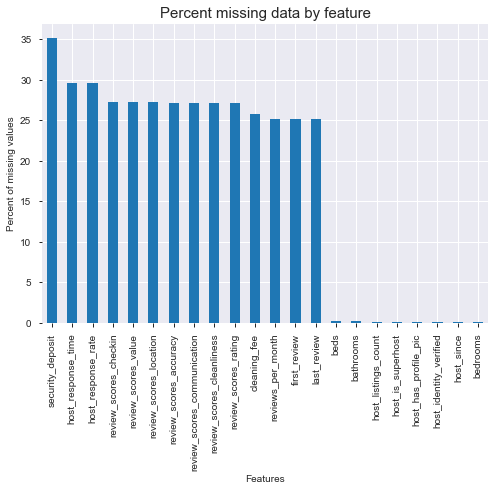

In [9]:
total_nan = data.isna().sum().sort_values(ascending=False)
percent_nan = (100*data.isna().sum()/data.isna().count()).sort_values(ascending=False)

missing_data = pd.concat([total_nan, percent_nan], axis=1, keys=['Total', 'Percent'])#reset_index #
#missing_data.columns = ['Features','Total', 'Percent']

over_zero=missing_data[missing_data.Total > 0]

plt.figure(figsize=(15,6))
#plt.subplots(figsize=(15, 6))
over_zero.plot.bar(rot=0,y='Percent',legend = False) #x=missing_data.index, y=missing_data['Percent']
plt.xticks(rotation='90')
plt.xlabel('Features', fontsize=10)
plt.ylabel('Percent of missing values',fontsize=10)
plt.title('Percent missing data by feature',fontsize=15)
plt.show

#missing_data
over_zero

#### Exploring the target (price)

* Replace '$' and ',' characters in the price value and then convert to number
* Remove observacions with price value equal 0.0 (19)
* Plot histogram and boxplot
* Create a new variable called 'price_range' and plot price range
* Plot Average price by property_type
* Plot Average price by experiences_offered
* Plot Average price by neighbourhood

Note: As price has over 900 uniques vales, the price_range column was created to reduce unique vales for a better visualisation and understanding the relationships

In [44]:
#replace - remove $ and convert to number
#create price range column
data["price"]= data["price"].str.replace('[$,]', '', regex=True).astype(float)

data["price"].value_counts().sort_index()

0.0        19
6.0         1
7.0         5
8.0        27
9.0         4
           ..
8000.0      1
9999.0      3
10000.0     2
12345.0     4
13700.0     1
Name: price, Length: 912, dtype: int64

In [45]:
#remove observation witn price value = 0.0
data.drop(data.index[data["price"] == 0.0], inplace = True)

##### Columns with boolean values (t/f). Looking at correlation with price

Are those variables relevants for predicting the price? 

For this analysis, it was needed to impute the missing data of these variables with 'f' values (False). And then replace 'f' and 't' with 0 and 1 respectively.

From the heatmap, we can see that those variables are not correlate with the price i.e. they are not relevant for predicting the price. Hence, we remove them

<Figure size 864x2880 with 0 Axes>

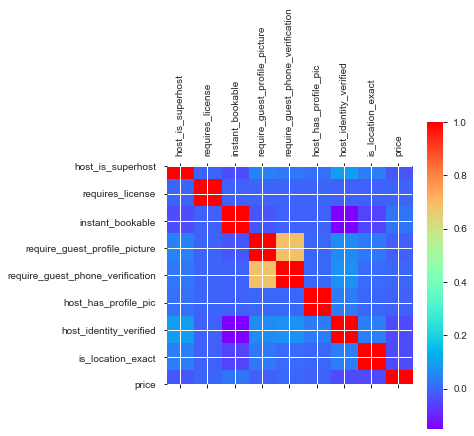

,host_is_superhost,requires_license,instant_bookable,require_guest_profile_picture,require_guest_phone_verification,host_has_profile_pic,host_identity_verified,is_location_exact,price
host_is_superhost,1.000000,-0.002072,-0.036981,0.049585,0.032492,0.017400,0.094644,0.041565,-0.021571
requires_license,-0.002072,1.000000,-0.004182,-0.000505,-0.000647,0.000240,-0.003752,-0.006245,-0.001622
instant_bookable,-0.036981,-0.004182,1.000000,-0.023634,-0.005375,-0.004920,-0.151125,-0.048595,0.027642
require_guest_profile_picture,0.049585,-0.000505,-0.023634,1.000000,0.681825,0.002689,0.060595,0.029957,-0.011204
require_guest_phone_verification,0.032492,-0.000647,-0.005375,0.681825,1.000000,0.004628,0.070037,0.007788,0.004636
host_has_profile_pic,0.017400,0.000240,-0.004920,0.002689,0.004628,1.000000,0.034625,0.005880,-0.003311
host_identity_verified,0.094644,-0.003752,-0.151125,0.060595,0.070037,0.034625,1.000000,0.040302,-0.042616
is_location_exact,0.041565,-0.006245,-0.048595,0.029957,0.007788,0.005880,0.040302,1.000000,-0.039972
price,-0.021571,-0.001622,0.027642,-0.011204,0.004636,-0.003311,-0.042616,-0.039972,1.000000


In [47]:
df = data[['host_is_superhost','requires_license','instant_bookable','require_guest_profile_picture',
'require_guest_phone_verification','host_has_profile_pic','host_identity_verified', 
'is_location_exact', 'price']].copy()


df[['host_is_superhost','requires_license','instant_bookable','require_guest_profile_picture',
'require_guest_phone_verification','host_has_profile_pic','host_identity_verified', 
'is_location_exact']].fillna('f', inplace = True) 

df[['host_is_superhost','requires_license','instant_bookable','require_guest_profile_picture',
'require_guest_phone_verification','host_has_profile_pic','host_identity_verified', 
'is_location_exact']] = df[['host_is_superhost','requires_license','instant_bookable','require_guest_profile_picture',
'require_guest_phone_verification','host_has_profile_pic','host_identity_verified', 
'is_location_exact']].replace('t', 1)

df[['host_is_superhost','requires_license','instant_bookable','require_guest_profile_picture',
'require_guest_phone_verification','host_has_profile_pic','host_identity_verified', 
'is_location_exact']] = df[['host_is_superhost','requires_license','instant_bookable','require_guest_profile_picture',
'require_guest_phone_verification','host_has_profile_pic','host_identity_verified', 
'is_location_exact']].replace('f', 0)

plt.figure(figsize=(12,40))
plt.matshow(df.corr(),cmap='rainbow')
plt.xticks(range(len(df.columns)), df.columns,rotation=90)
plt.yticks(range(len(df.columns)), df.columns)
plt.colorbar()
plt.tight_layout()
plt.show()

df.corr()

Checking the price correlation with review scores variables

<Figure size 864x2880 with 0 Axes>

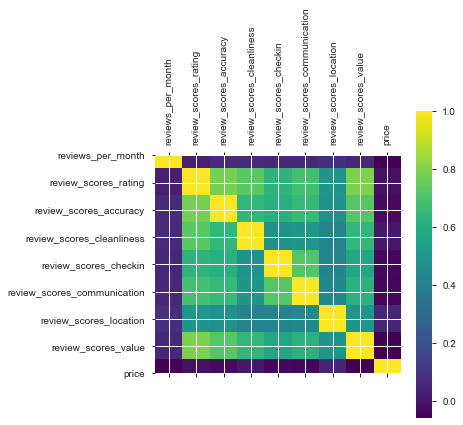

,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,price
reviews_per_month,1.000000,0.032534,0.068717,0.068777,0.063639,0.060174,0.090650,0.064593,-0.050228
review_scores_rating,0.032534,1.000000,0.777566,0.731220,0.629548,0.685872,0.494052,0.791452,-0.009205
review_scores_accuracy,0.068717,0.777566,1.000000,0.643484,0.613978,0.652541,0.476267,0.721763,-0.027710
review_scores_cleanliness,0.068777,0.731220,0.643484,1.000000,0.486784,0.501845,0.412455,0.643952,0.009865
review_scores_checkin,0.063639,0.629548,0.613978,0.486784,1.000000,0.717510,0.418695,0.575517,-0.036377
review_scores_communication,0.060174,0.685872,0.652541,0.501845,0.717510,1.000000,0.438111,0.618309,-0.041820
review_scores_location,0.090650,0.494052,0.476267,0.412455,0.418695,0.438111,1.000000,0.500887,0.054811
review_scores_value,0.064593,0.791452,0.721763,0.643952,0.575517,0.618309,0.500887,1.000000,-0.057195
price,-0.050228,-0.009205,-0.027710,0.009865,-0.036377,-0.041820,0.054811,-0.057195,1.000000


In [48]:
#check correlation with price
df = data[['reviews_per_month', 'review_scores_rating','review_scores_accuracy','review_scores_cleanliness',
'review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value','price']]

plt.figure(figsize=(12,40))
plt.matshow(df.corr(),cmap='viridis')
plt.xticks(range(len(df.columns)), df.columns,rotation=90)
plt.yticks(range(len(df.columns)), df.columns)
plt.colorbar()
plt.tight_layout()
plt.show()

df.corr()

Removing unnecessary variables

In [49]:
remove_cols = ['host_is_superhost','requires_license','instant_bookable','require_guest_profile_picture',
'require_guest_phone_verification','host_has_profile_pic','host_identity_verified', 
'is_location_exact','reviews_per_month', 'review_scores_rating','review_scores_accuracy','review_scores_cleanliness',
'review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value']

data.drop(remove_cols, axis=1, inplace=True)

#Copy the transformed dataset
data.to_csv('listings_reduced.csv',index=False) #df.to_csv(index=False)
data.shape

(83830, 35)

In [15]:
#summary of categoricals
data.describe(include=['O'])

,experiences_offered,host_since,host_response_time,host_response_rate,host_verifications,neighbourhood_cleansed,property_type,room_type,bed_type,amenities,security_deposit,cleaning_fee,extra_people,calendar_updated,first_review,last_review,cancellation_policy
count,83830,83783,59051,59051,83830,83830,83830,83830,83830,83830,54358,62260,83830,83830,62812,62812,83830
unique,5,3343,4,78,548,33,40,3,5,73694,387,247,106,98,2702,1735,8
top,none,2015-05-21,within an hour,100%,"['email', 'phone', 'reviews', 'jumio', 'govern...",Westminster,Apartment,Entire home/apt,Real Bed,{},$0.00,$0.00,$0.00,today,2019-01-01,2019-07-07,strict_14_with_grace_period
freq,82040,1197,36279,39276,10090,9409,56790,47132,83095,377,18708,5939,51306,21538,251,2417,35869


In [16]:
data[['security_deposit','price','cleaning_fee','extra_people']]

,security_deposit,price,cleaning_fee,extra_people
0,$100.00,65.0,$15.00,$15.00
1,$150.00,100.0,$50.00,$0.00
2,$350.00,300.0,$65.00,$10.00
3,$250.00,175.0,$70.00,$0.00
4,$250.00,65.0,$50.00,$11.00
...,...,...,...,...
83845,$0.00,100.0,$50.00,$40.00
83846,NaN,82.0,NaN,$0.00
83847,NaN,78.0,NaN,$0.00
83848,NaN,82.0,NaN,$0.00


#### Checking price distribution

The histogram shows that Price is right skewed. After aplyied log, the histogram improve but still skewed. the boxplot shows that price has outliers however we keep them. Those point might not be outliers might as price is usually high.

count    83830.000000
mean       121.673518
std        224.899524
min          6.000000
25%         45.000000
50%         81.000000
75%        140.000000
max      13700.000000
Name: price, dtype: float64

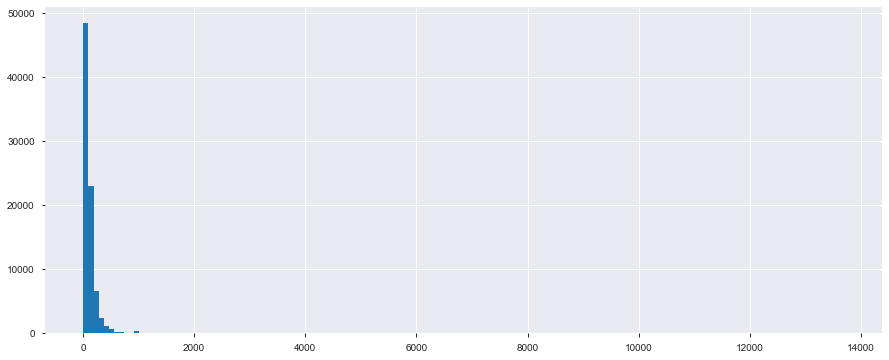

In [17]:
data.price.hist(bins=150, figsize=(15, 6))
data.price.describe()

count    83830.000000
mean         4.425626
std          0.787561
min          1.791759
25%          3.806662
50%          4.394449
75%          4.941642
max          9.525151
Name: price, dtype: float64

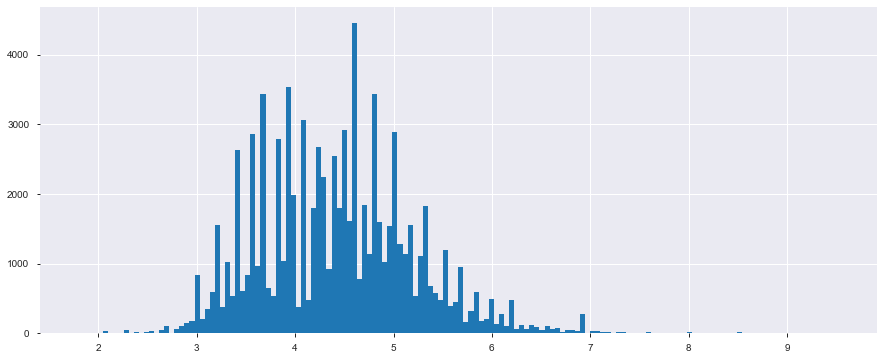

In [18]:
#apply log to price
price = np.log(data.price)
price.hist(bins=150, figsize=(15, 6))
price.describe()

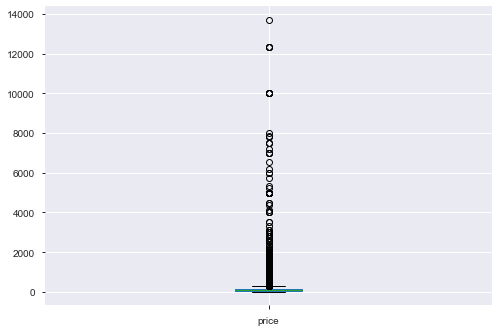

In [19]:
boxplot = data.boxplot(column=['price'])# 'security_deposit','cleaning_fee', 'extra_people',

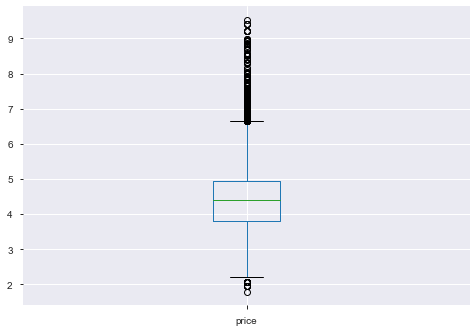

In [20]:
boxplot = price.plot.box()#column=['price']

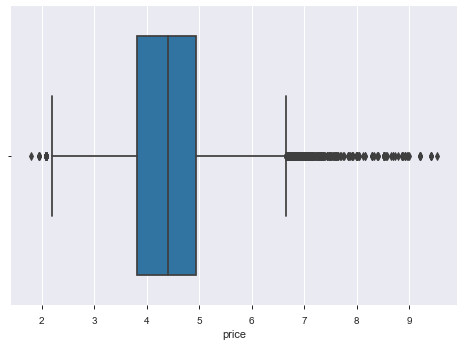

In [21]:
import seaborn as sns
sns.boxplot(x=price)

#### Plots for price range

In [22]:
df = data[['property_type','accommodates','neighbourhood_cleansed', 'experiences_offered','amenities','price']].copy()
#df.head()

In [23]:
#price range
df['price_range'] = pd.cut(x=df['price'], bins=[0,15, 25, 50, 75,100, 150,200,350,500,700,999,1500,3000]).astype(str)

print(df.price_range.value_counts())
#df.head(20)


(25.0, 50.0]        21415
(100.0, 150.0]      14226
(75.0, 100.0]       14074
(50.0, 75.0]        13021
(150.0, 200.0]       7167
(200.0, 350.0]       6302
(15.0, 25.0]         4023
(350.0, 500.0]       1850
(500.0, 700.0]        609
(999.0, 1500.0]       376
(700.0, 999.0]        331
(0.0, 15.0]           299
(1500.0, 3000.0]       82
nan                    55
Name: price_range, dtype: int64


Most commun price range is (25,50]. The majority of prices are between 25 and 150

In [24]:
print("accommodates\n", df.accommodates.value_counts())
print("\nproperty type\n", df.property_type.value_counts())
print("\nneighbourhood\n", df.neighbourhood_cleansed.value_counts())
print("\nexperiences_offered\n", df.experiences_offered.value_counts())

accommodates
 2     35312
4     16651
1     10607
6      6731
3      5699
5      3917
8      2029
7      1379
10      539
9       413
12      179
11      110
16      102
14       89
13       49
15       23
0         1
Name: accommodates, dtype: int64

property type
 Apartment                 56790
House                     17433
Townhouse                  2977
Serviced apartment         1896
Condominium                1107
Bed and breakfast           877
Loft                        714
Guest suite                 355
Guesthouse                  279
Hostel                      231
Boutique hotel              222
Other                       206
Hotel                       151
Bungalow                    132
Cottage                      83
Villa                        62
Boat                         57
Aparthotel                   54
Tiny house                   43
Houseboat                    30
Cabin                        24
Casa particular (Cuba)       21
Camper/RV                    

In [25]:
price_counts = df.price_range.value_counts().sort_index() #sort_values(ascending=False)
#price_counts

#group by
experiences_agg = df.groupby('experiences_offered')['price'].agg(['mean', 'median','min','max','std']).reset_index()
#print(experiences_agg)

experiences_counts=df.groupby(['experiences_offered','price_range'])['price_range'].size().reset_index(name='count')
#experiences_counts.head()

prop_type_agg = df.groupby('property_type')['price'].agg(['mean', 'median','min','max','std']).reset_index()
#print(prop_type_agg)

prop_type_counts=df.groupby(['property_type','price_range'])['price_range'].size().reset_index(name='count')
#prop_type_counts.head()

neighbourhood_agg = df.groupby('neighbourhood_cleansed')['price'].agg(['mean', 'median','min','max','std']).reset_index()
#print(neighbourhood_agg)

neighbourhood_counts=df.groupby(['neighbourhood_cleansed','price_range'])['price_range'].size().reset_index(name='count')
#neighbourhood_counts.head()

In [26]:
experiences2=df.groupby(['price_range','experiences_offered'])['experiences_offered'].size().reset_index(name='count')
print(experiences2.head(20))
experiences_counts.head()

         price_range experiences_offered  count
0        (0.0, 15.0]                none    297
1        (0.0, 15.0]              social      2
2     (100.0, 150.0]            business    110
3     (100.0, 150.0]              family    140
4     (100.0, 150.0]                none  13855
5     (100.0, 150.0]            romantic     72
6     (100.0, 150.0]              social     49
7       (15.0, 25.0]            business     22
8       (15.0, 25.0]              family      2
9       (15.0, 25.0]                none   3974
10      (15.0, 25.0]            romantic      1
11      (15.0, 25.0]              social     24
12    (150.0, 200.0]            business     47
13    (150.0, 200.0]              family    103
14    (150.0, 200.0]                none   6977
15    (150.0, 200.0]            romantic     24
16    (150.0, 200.0]              social     16
17  (1500.0, 3000.0]                none     82
18    (200.0, 350.0]            business     31
19    (200.0, 350.0]              family

,experiences_offered,price_range,count
0,business,"(100.0, 150.0]",110
1,business,"(15.0, 25.0]",22
2,business,"(150.0, 200.0]",47
3,business,"(200.0, 350.0]",31
4,business,"(25.0, 50.0]",155


#### Plotting - price distribution by property type, experiences and Neighbourhood

,experiences_offered,mean,median,min,max,std
0,business,100.648515,75.0,21.0,1200.0,95.904120
1,family,169.897638,145.0,25.0,901.0,105.197201
2,none,121.795453,80.0,6.0,13700.0,226.875389
3,romantic,132.821429,109.0,25.0,1000.0,105.111490
4,social,68.006637,54.0,14.0,364.0,44.343673


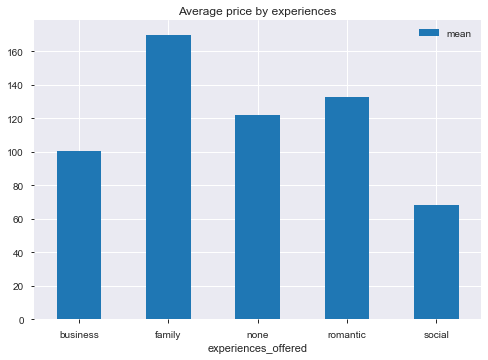

In [27]:
experiences_agg.plot.bar(x='experiences_offered',y='mean',rot=0)
plt.title('Average price by experiences')
experiences_agg.head()

,property_type,mean,median,min,max,std
0,Aparthotel,110.092593,100.0,45.0,300.0,56.376855
1,Apartment,120.825938,90.0,7.0,12345.0,200.162542
2,Barn,491.666667,97.5,50.0,4000.0,1117.579229
3,Bed and breakfast,92.922463,58.0,12.0,7852.0,357.066279
4,Boat,180.578947,95.0,30.0,1995.0,367.869297


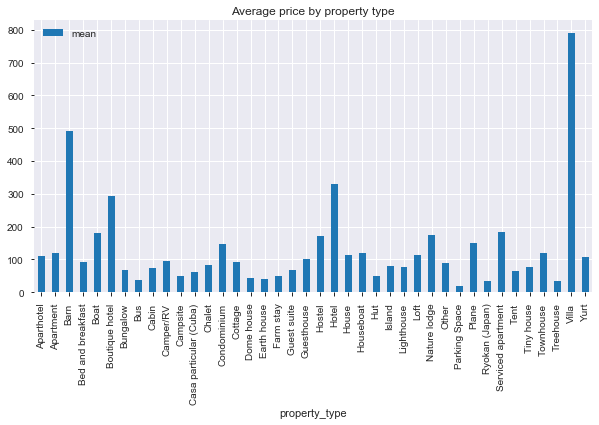

In [28]:

prop_type_agg.plot.bar(x='property_type',y='mean',rot=90,figsize=(10,5))
plt.title('Average price by property type')
prop_type_agg.head()

,property_type,mean,median,min,max,std
0,Aparthotel,110.092593,100.0,45.0,300.0,56.376855
1,Apartment,120.825938,90.0,7.0,12345.0,200.162542
2,Barn,491.666667,97.5,50.0,4000.0,1117.579229
3,Bed and breakfast,92.922463,58.0,12.0,7852.0,357.066279
4,Boat,180.578947,95.0,30.0,1995.0,367.869297


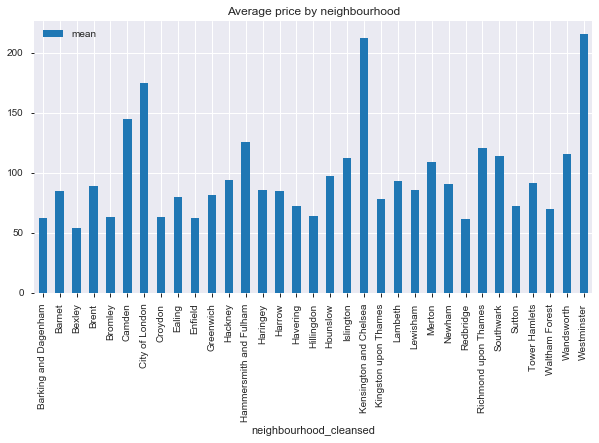

In [29]:
neighbourhood_agg.plot.bar(x='neighbourhood_cleansed',y='mean',rot=90,figsize=(10,5))
plt.title('Average price by neighbourhood')
prop_type_agg.head()

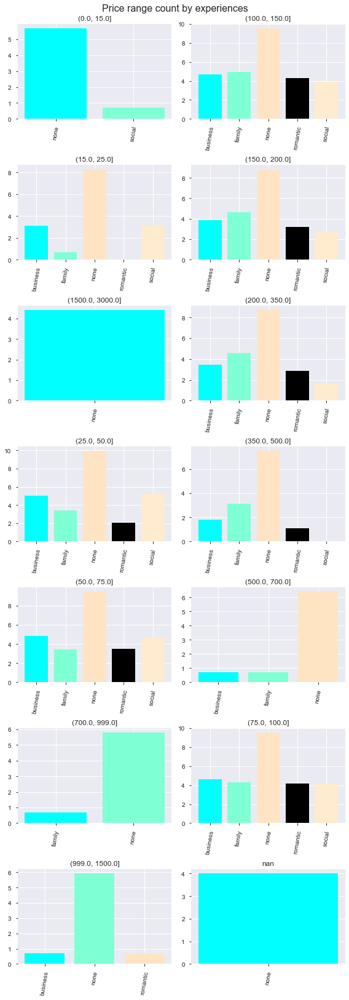

In [30]:
excluding = ['white','ivory','azure','beige','aliceblue', 'antiquewhite','snow','cornsilk','floralwhite', 'ghostwhite','indianred', 'lawngreen', 'lemonchiffon','gainsboro','honeydew']
colors = [name for name in mcd.CSS4_COLORS if name not in excluding  and 'light' not in name]

fig = plt.figure(figsize=(8,45))

fig.suptitle("Price range count by experiences", fontsize=16)

for t,i in zip(experiences2.price_range.sort_values().unique(),range(1,15)):
    d = experiences2[experiences2.price_range == t][['experiences_offered','count']]        
    cn = colors[i-1]
        
    ax = fig.add_subplot(14,2,i)
    
    n = len(d)
    #As count column is highly skewed, log is applied to visualise the data
    ax.bar(d['experiences_offered'], np.log(d['count']), color=colors[0:n])
    
    ax.set_title(t)
    ax.set_xticklabels( d['experiences_offered'], rotation=80 )
    
    
fig.tight_layout()
fig.subplots_adjust(top=0.97)
plt.show()

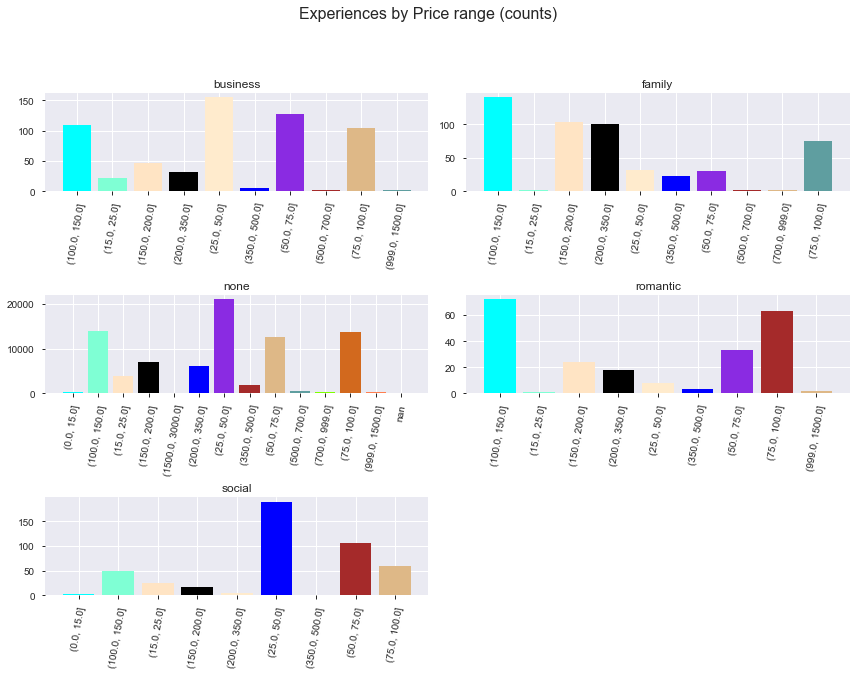

In [31]:
excluding = ['white','ivory','azure','beige','aliceblue', 'antiquewhite','snow','cornsilk','floralwhite', 'ghostwhite','indianred', 'lawngreen', 'lemonchiffon','gainsboro','honeydew']
colors = [name for name in mcd.CSS4_COLORS if name not in excluding  and 'light' not in name]

fig = plt.figure(figsize=(12,40))

fig.suptitle("Experiences by Price range (counts)", fontsize=16)

for t,i in zip(experiences_counts.experiences_offered.unique(),range(1,6)):
    d = experiences_counts[experiences_counts.experiences_offered == t][['price_range','count']]        
    cn = colors[i-1]
        
    ax = fig.add_subplot(14,2,i)
    
    n = len(d)
    ax.bar(d['price_range'].astype(str), d['count'], color=colors[0:n])
    
    ax.set_title(t)
    ax.set_xticklabels( d['price_range'].astype(str), rotation=80 )
    
    
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

In [32]:
def plotting(title, df,col_loop,cols_plot):

    fig = plt.figure(figsize=(12,40))

    fig.suptitle(title, fontsize=16)

    for t,i in zip(df[col_loop].unique(),range(1,30)):
        d = df[df[col_loop] == t][cols_plot]
        cn = colors[i-1]
        
        ax = fig.add_subplot(15,2,i) #14 plots per row and 2 per column add to a total number of 14*2 = 28
    
        n = len(d)
        ax.bar(d[cols_plot[0]], d[cols_plot[1]], color=colors[0:n])#
    
        ax.set_title(t)
        ax.set_xticklabels( d[cols_plot[0]], rotation=90 )#.astype(str)
    
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)
    plt.show()

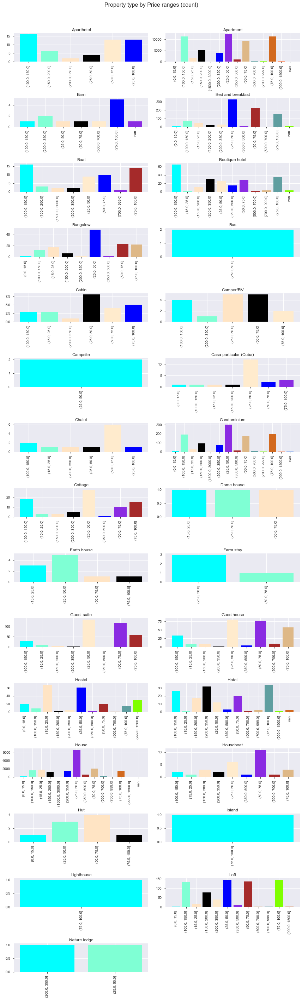

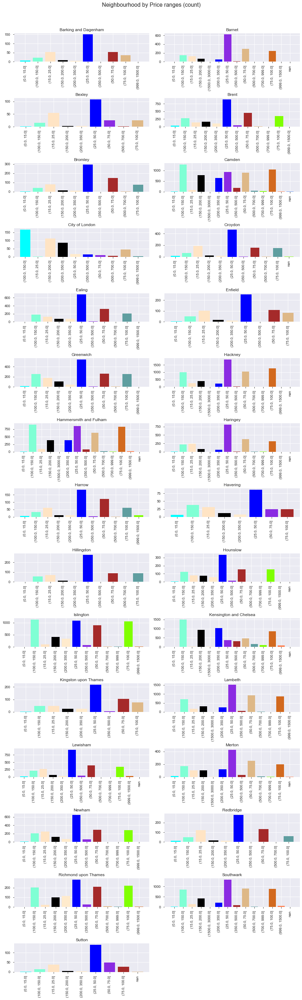

In [33]:
#prop_type_counts['price_range'] = prop_type_counts['price_range'].astype(str)
#neighbourhood_counts['price_range'] = neighbourhood_counts['price_range'].astype(str)
plotting('Property type by Price ranges (count)',prop_type_counts, 'property_type',['price_range','count'])
plotting('Neighbourhood by Price ranges (count)',neighbourhood_counts, 'neighbourhood_cleansed',['price_range','count'])

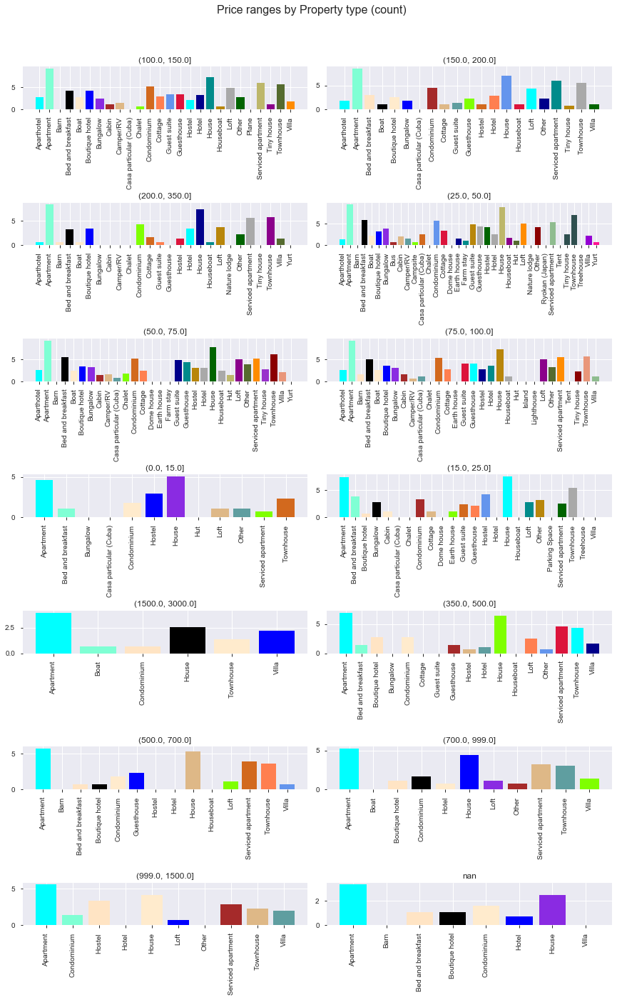

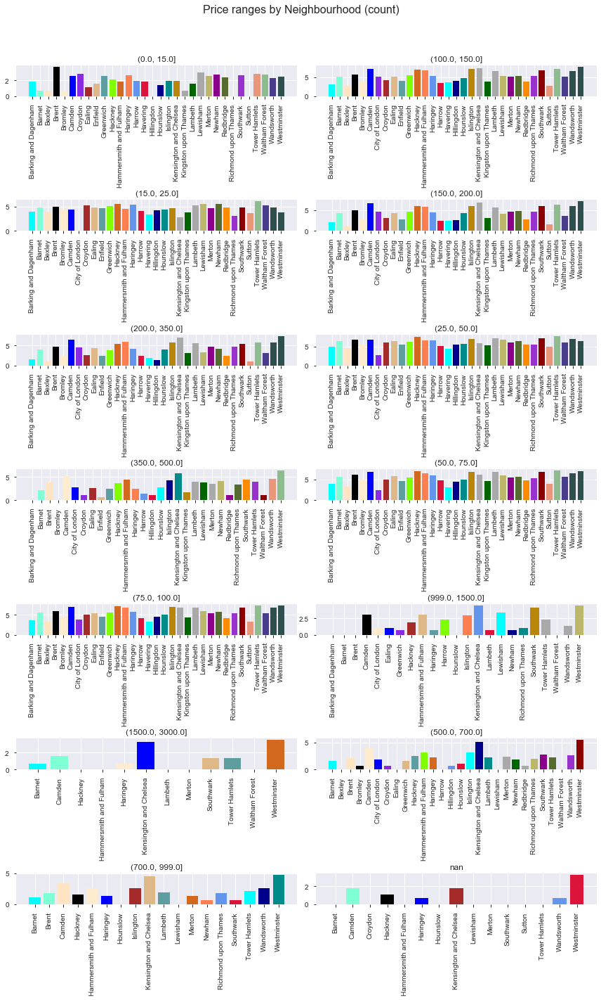

In [34]:
prop_type_counts['count'] = np.log(prop_type_counts['count'])
neighbourhood_counts['count'] = np.log(neighbourhood_counts['count'])
plotting('Price ranges by Property type (count)',prop_type_counts, 'price_range',['property_type','count'])
plotting('Price ranges by Neighbourhood (count)',neighbourhood_counts, 'price_range',['neighbourhood_cleansed','count'])

There are two type of property names that look weird. We keep them as the hoster might describe them as similar in other contries.

In [35]:
data[data.property_type == 'Ryokan (Japan)']

,id,experiences_offered,host_since,host_response_time,host_response_rate,host_listings_count,host_verifications,neighbourhood_cleansed,latitude,longitude,...,calendar_updated,availability_30,availability_365,number_of_reviews,number_of_reviews_ltm,first_review,last_review,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_private_rooms
26975,16563709,none,2016-10-02,a few days or more,0%,2.0,"['email', 'phone', 'facebook', 'reviews']",Southwark,51.47662,-0.05966,...,19 months ago,30,365,17,8,2017-01-06,2018-12-09,flexible,2,2


In [36]:
data[data.property_type == 'Casa particular (Cuba)'][['price']]

,price
28077,44.0
34568,50.0
44899,25.0
46799,75.0
52494,100.0
53262,45.0
56344,29.0
57055,42.0
57605,101.0
60168,44.0
